In [1]:
using ViscousFlow
using Plots

┌ Info: Recompiling stale cache file C:\Users\nitin\.julia\compiled\v1.1\ViscousFlow\2kdbn.ji for ViscousFlow [103da179-b3e4-57c1-99a4-586354eb2c5a]
└ @ Base loading.jl:1184
┌ Info: Recompiling stale cache file C:\Users\nitin\.julia\compiled\v1.1\Plots\ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1184


# Setting Up Kinematics Functions

In [2]:
struct TriangleWave <: RigidBodyMotions.Profile
    w::Float64
    round_factor::Float64
end

(T::TriangleWave)(t) = 1/(1-2/pi*acos(1-T.round_factor))*(1-2/pi*acos((1-T.round_factor)*sin(T.w*t - pi/2)))

In [3]:
struct SquareWave <: RigidBodyMotions.Profile
    w::Float64
    round_factor::Float64
end

(s::SquareWave)(t) = 1/atan(1/s.round_factor)*atan(sin(s.w*t)/s.round_factor)

In [4]:
struct PitchHeaveTest <: Kinematics
    "Freestream velocity"
    U₀::Float64

    "Axis of pitch rotation, relative to the plate centroid"
    a::Float64

    "Reduced frequency ``K = \\frac{\\Omega c}{2U_0}``"
    K::Float64

    "Phase lag of pitch to heave (in radians)"
    ϕ::Float64

    "Mean angle of attack"
    α₀::Float64

    "Amplitude of pitching"
    Δα::Float64

    "Amplitude of translational heaving"
    A::Float64
    
    "Sinusoidal nature of pitching/heaving"
    delta_pitch::Float64
    delta_heave::Float64

    Y::RigidBodyMotions.Profile
    Ẏ::RigidBodyMotions.Profile
    Ÿ::RigidBodyMotions.Profile

    α::RigidBodyMotions.Profile
    α̇::RigidBodyMotions.Profile
    α̈::RigidBodyMotions.Profile
    
end

In [5]:
function PitchHeaveTest(U₀, a, K, ϕ, α₀, Δα, A)
    p = A*RigidBodyMotions.Sinusoid(2K)
    ṗ = d_dt(p)
    p̈ = d_dt(ṗ)
    α = RigidBodyMotions.ConstantProfile(α₀) + Δα*(RigidBodyMotions.Sinusoid(2K) >> (ϕ/(2K)))
    α̇ = d_dt(α)
    α̈ = d_dt(α̇)
    PitchHeaveTest(U₀, a, K, ϕ, α₀, Δα, A, 1, 1, p, ṗ, p̈, α, α̇, α̈)
end

PitchHeaveTest

In [6]:
function PitchHeaveTest(U₀, a, K, ϕ, α₀, Δα, A, delta_pitch, delta_heave)
    p = A*TriangleWave(2K, delta_heave)
    ṗ = d_dt(p)
    p̈ = d_dt(ṗ)
    # α = RigidBodyMotions.ConstantProfile(α₀) + Δα*(SquareWave(2K, delta_pitch) >> (ϕ/(2K)))
    α = RigidBodyMotions.ConstantProfile(α₀) + Δα*(SquareWave(2K, delta_pitch))
    α̇ = d_dt(α)
    α̈ = d_dt(α̇)
    PitchHeaveTest(U₀, a, K, ϕ, α₀, Δα, A, delta_pitch, delta_heave, p, ṗ, p̈, α, α̇, α̈)
end

PitchHeaveTest

In [7]:
function (p::PitchHeaveTest)(t)
    α = p.α(t)
    α̇ = p.α̇(t)
    α̈ = p.α̈(t)

    c = p.U₀*t + im*p.Y(t) - p.a*exp(im*α)
    ċ = p.U₀ + im*p.Ẏ(t) - p.a*im*α*exp(im*α)*α̇ 
    c̈ = im*p.Ÿ(t) - p.a*im*α̇ *exp(im*α)*α̇  + p.a*α^2*exp(im*α)*α̇ ^2 - p.a*im*α*exp(im*α)*α̈ 

    return c, ċ, c̈, α, α̇, α̈
end

# Setting Up Body and Environment

In [8]:
Re = 200; # Re_ref = U_ref*L/v, U_ref = 1/L, v = 1/Re_ref -> 1/Re
U = 0.0;
U∞ = (U,0.0);

# n = 102;
# a = 0.5; b = 0.05;
# body = Bodies.Ellipse(a,b,n)

n = 51;
a = 1.0;
body = Plate(a, n);

In [9]:
a = 0.5 # location of pitch axis, a = 0.5 is leading edge
ϕ = 0  # phase lag of pitch to heave
A = 0.5  # amplitude/chord
# fstar = 1.0/5 # fc/U
fstar = 1.0/2
α₀ = 0 # mean angle of attack
# Δα = 5π/180 # amplitude of pitching
Δα = 30π/180
U₀ = 0.0 # translational motion (set to zero in place of free stream)

K = π*fstar # reduced frequency, K = πfc/U

oscil = PitchHeaveTest(U₀,a,K,ϕ,α₀,Δα,A, 0.25, 0.1);
# oscil = PitchHeaveTest(U₀,a,K,ϕ,α₀,Δα,A)
motion = RigidBodyMotion(oscil)

Rigid Body Motion:
  ċ = 0.0 + 0.0im
  c̈ = 0.0 - 3.22im
  α̇ = 4.96
  α̈ = 0.0
  PitchHeaveTest(0.0, 0.5, 1.5707963267948966, 0.0, 0.0, 0.5235987755982988, 0.5, 0.25, 0.1, 0.5 × (TriangleWave(3.141592653589793, 0.1)), d/dt (0.5 × (TriangleWave(3.141592653589793, 0.1))), d/dt (d/dt (0.5 × (TriangleWave(3.141592653589793, 0.1)))), AddedProfiles:
  Constant (0)
  0.5235987755982988 × (SquareWave(3.141592653589793, 0.25))
, d/dt (AddedProfiles:
  Constant (0)
  0.5235987755982988 × (SquareWave(3.141592653589793, 0.25))
), d/dt (d/dt (AddedProfiles:
  Constant (0)
  0.5235987755982988 × (SquareWave(3.141592653589793, 0.25))
)))

In [10]:
time = 0.0:0.02:2.0;
xlim = (-2.0,2.0)
ylim = (-2.0,2.0)
newanim = @animate for t in time
    m = motion(t);
    T = RigidTransform(m[1], m[4]);
    T(body);
    plot(xlim=xlim, ylim=ylim, body)
end
gif(newanim, "fixed_motion.gif")

┌ Info: Saved animation to 
│   fn = C:\Users\nitin\Documents\ViscousFlow.jl-master\ViscousFlow.jl-master\fixed_motion.gif
└ @ Plots C:\Users\nitin\.julia\packages\Plots\ex9On\src\animation.jl:90


Plots.AnimatedGif("C:\\Users\\nitin\\Documents\\ViscousFlow.jl-master\\ViscousFlow.jl-master\\fixed_motion.gif")

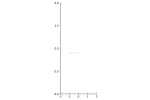

In [11]:
# cent = 0.0 - A*im # change to 0.0 - A*im for flapping using square and triangle waves, otherwise 0.0 + 0.0im
# cent = 0.0 - 0.0im
# α = 0.0 # change to -Δα for flapping using sinusoidal waves, otherwise 0.0
# α = -Δα
m = motion(0.0);
cent = m[1];
α = m[4];

T = RigidTransform(cent,α)
T(body) # transform the body to the current configuration

xlim = (-2.0,2.0)
ylim = (-5.0,5.0)

plot(xlim=xlim, ylim=ylim, body)


In [12]:
X = VectorData(body.x,body.y);
X̃ = VectorData(body.x̃,body.ỹ);

Umax = (0.25*pi/(2*K*2*a)) #1/(0.25*pi/(2*K*2*a))

Δx = 0.02;
Δt = 0.005; # min(0.5*Δx/Umax,0.5*Δx^2*Re^2*2*a*Umax); # comparing 2 different time scales for the problem

# Setting Up the System and Solver

In [13]:
sys = NavierStokes(Re,Δx,xlim,ylim,Δt,U∞ = U∞, X̃ = X̃, isstore = true, isstatic = false)
#isstore = false solves the system iteratively, = true solves the system using Gaussian elimination

Navier-Stokes system on a grid of size 202 x 502

In [14]:
w₀ = Nodes(Dual,size(sys));
u = (w₀,[real(cent),imag(cent),α])
xg, yg = coordinates(w₀,dx=Δx,I0=Systems.origin(sys))
f = (VectorData(X̃),Vector{Float64}());

In [15]:
using LinearAlgebra
plans = ((t,u) -> Fields.plan_intfact(t,u,sys),(t,u)-> I)

function TimeMarching.plan_constraints(u::Tuple{Nodes{Dual,NX,NY},Vector{Float64}},t,sys::NavierStokes{NX,NY,N,false}) where {NX,NY,N}

  # for now, just assume that there is only one body. will fix later.

  xc, yc, α = u[2]
  T = Bodies.RigidTransform((xc,yc),α)
  # should be able to save some time and memory allocation here...
  x, y = T(sys.X̃.u,sys.X̃.v)
  X = VectorData(x,y)
  regop = Regularize(X,cellsize(sys);issymmetric=true,I0=origin(sys))
  if sys._isstore
    Hmat, Emat = RegularizationMatrix(regop,VectorData{N}(),Edges{Primal,NX,NY}())

    sys.Hmat = Hmat
    sys.Emat = Emat

    return (f->TimeMarching.B₁ᵀ(f,sys), f->zeros(Float64,size(u[2]))),
           (w->TimeMarching.B₂(w,sys), u->Vector{Float64}())
  else
    return (f->TimeMarching.B₁ᵀ(f,regop,sys), f->zeros(Float64,size(u[2]))),
           (w->TimeMarching.B₂(w,regop,sys), u->Vector{Float64}())
  end


end

planConstraintsFn = (u,t) -> TimeMarching.plan_constraints(u,t,sys)
r1Fn = (u,t) -> Systems.r₁(u,t,sys,motion)
r2Fn = (u,t) -> Systems.r₂(u,t,sys,motion)

#27 (generic function with 1 method)

In [16]:
ifherk = IFHERK(u,f,sys.Δt,plans,planConstraintsFn,(r1Fn,r2Fn),tol=1e-3,rk=TimeMarching.RK31,isstored=true,isstaticconstraints=false)
#isstored = false: solve the system iteratively

Order-3 IF-HERK integrator with
   State of type Tuple{Nodes{Dual,202,502},Array{Float64,1}}
   Force of type Tuple{VectorData{51},Array{Float64,1}}
   Time step size 0.005


# Running the Solver

In [17]:
t = 0.0
w₀ .= 0.0
u = (deepcopy(w₀),[real(cent),imag(cent),α])
f = (VectorData(X̃),Vector{Float64}());
tf = 10;
T = Δt:Δt:tf;
fx = Float64[];
fy = Float64[];
thist = [];
uhist = [];
utemp = u;
tsample = 0.02;

In [ ]:
@time for ti in T
    global t, u, f = ifherk(t,u)

    # save data for later use
    push!(thist,t)
    push!(fx,sum(f[1].u)*Δx^2)
    push!(fy,sum(f[1].v)*Δx^2)

    if (isapprox(mod(t,tsample),0,atol=1e-12) || isapprox(mod(t,tsample),tsample,atol=1e-12))
      utemp = deepcopy(u)
      push!(uhist, utemp)
    end

end
println("solution completed through time t = ",t)

In [ ]:
newanim5 = @animate for i in 1:length(uhist)
    T = RigidTransform(uhist[i][2])
    T(body)
    plot(xg,yg,uhist[i],levels=range(-0.5,stop=0.5,length=30), color = :RdBu)
    plot!(xlim=xlim, ylim=ylim, body)
    #plot(xlim=xlim, ylim=ylim, xg,yg,uhist[i])
end

gif(newanim5, "TestPulsesPlate.gif")


In [ ]:
px = plot(thist,2*fx,xlabel="Convective time",ylabel="CL",legend=false)
py = plot(thist,2*fy,xlabel="Convective time",ylabel="CD",legend=false)
plot(px,py)

In [ ]:
savefig("TestPulsesPlate.pdf")

In [ ]:
uhist[end][2]

In [ ]:
motion(2.0)